In [1]:
import os
import glob

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import plotly.graph_objects as go
import plotly.express as px

from collections.abc import Callable
from IPython.display import display

pd.set_option('display.max_rows', 200)

In [2]:
def read_dataset_part(dataset_part: str):
    file_in_parts_pattern = os.path.join(path, f"results_{dataset_part}_part*.csv")
    part_files = sorted(glob.glob(file_in_parts_pattern))

    if part_files:
        print(f"Merging {len(part_files)} part files")
        df = pd.concat((pd.read_csv(f) for f in part_files), ignore_index=True)
    else:
        single_file = os.path.join(path, f"results_{dataset_part}.csv")
        df = pd.read_csv(single_file)

    return df

In [3]:
dataset_types = ["institutions", "institution_subnets", "ip_addresses_sample"]
metric_for_eval = "SMAPE"
column_subset = ["n_bytes", "n_flows", "n_packets"]

training_window_specific = 24
prediction_window_specific = 1

path = "../results/"

df_dict = {dt: read_dataset_part(dt) for dt in dataset_types}
models = list(df_dict["institutions"]["MODEL"].drop_duplicates())

Merging 2 part files


In [4]:
def do_for_all(df_dict: dict, func: Callable, *args, **kwargs):
    """
    Applies the given function `func` to every DataFrame in `df_dict`.
    Additional positional and keyword arguments can be passed through.
    
    Parameters
    ----------
    df_dict : dict
        Dictionary of DataFrames.
    func : callable
        A function that takes a DataFrame as the first argument.
    *args : tuple
        Any additional positional arguments for `func`.
    **kwargs : dict
        Any additional keyword arguments for `func`.
    
    Returns
    -------
    dict
        Dictionary of results, with the same keys as `df_dict`.
    """
    
    df_results = [] 
    for name, df in df_dict.items():
        result = func(df, *args, **kwargs)
        result = result.add_suffix(f"_{name}")
        df_results.append(result)
    combined_df = pd.concat(df_results, axis=1)
    display(combined_df)



### Compare models overall

In [5]:
do_for_all(
    df_dict,
    lambda df: df.groupby("MODEL")[[metric_for_eval]].mean()
)

,SMAPE_institutions,SMAPE_institution_subnets,SMAPE_ip_addresses_sample
MODEL,,,
ETSformer,40.324032,45.350206,167.138048
GRU,43.879353,50.765683,174.829921
GRU-FCN,39.715439,47.736958,173.727074
InceptionTime,61.573242,68.243524,174.830545
LSTM,43.453465,50.425960,174.733399
LSTM-FCN,43.075252,50.105021,173.799166
Mean,39.015818,40.434345,101.380952
RCLSTM,61.229645,66.636502,165.420423
ResNet,54.480505,61.756112,175.869351


### Compare training and prediction windows combinations

In [6]:
do_for_all(
    df_dict,
    lambda df: df.groupby(by=["TRAINING_WINDOW", "PREDICTION_WINDOW"])[[metric_for_eval]].mean()
)

SMAPE_institutions  \
TRAINING_WINDOW PREDICTION_WINDOW                       
24              1                           31.574006   
                24                          23.273567   
168             1                           33.670621   
                24                          56.526386   
                168                         39.797104   
744             1                           39.424940   
                168                         75.871874   

                                   SMAPE_institution_subnets  \
TRAINING_WINDOW PREDICTION_WINDOW                              
24              1                                  38.354147   
                24                                 29.163260   
168             1                                  40.220812   
                24                                 62.168949   
                168                                44.902114   
744             1                                  45.911639   
                168                                80.716068   

                                   SMAPE_ip_addresses_sample  
TRAINING_WINDOW PREDICTION_WINDOW                             
24              1                                 153.602969  
                24                                167.314053  
168             1                                 160.881141  
                24                                167.422751  
                168                               171.441465  
744             1                                 165.557364  
                168                               173.320371

### Compare model, training and prediction windows combinations

In [7]:
do_for_all(
    df_dict,
    lambda df: df.groupby(by=["MODEL", "TRAINING_WINDOW", "PREDICTION_WINDOW"])[[metric_for_eval]].mean()
)

SMAPE_institutions  \
MODEL         TRAINING_WINDOW PREDICTION_WINDOW                       
ETSformer     24              1                           34.492490   
              168             1                           31.523962   
                              24                          46.481738   
              744             1                           32.113831   
                              168                         57.008139   
GRU           24              1                           31.269812   
              168             1                           31.196539   
                              24                          61.083796   
              744             1                           31.509178   
                              168                         64.337439   
GRU-FCN       24              1                           29.565308   
              168             1                           31.386899   
                              24                          45.693374   
              744             1                           40.886794   
                              168                         51.044819   
InceptionTime 24              1                           37.730708   
              168             1                           43.220244   
                              24                          86.896218   
              744             1                           53.650594   
                              168                         86.368447   
LSTM          24              1                           30.960879   
              168             1                           31.382122   
                              24                          59.521240   
              744             1                           31.336801   
                              168                         64.066286   
LSTM-FCN      24              1                           29.375790   
              168             1                           31.550941   
                              24                          51.549994   
              744             1                           43.017126   
                              168                         59.882409   
Mean          24              1                           33.233922   
              168             1                           38.760786   
                              24                          39.204022   
              744             1                           41.699020   
                              168                         42.181342   
RCLSTM        24              1                           27.563086   
              168             1                           27.620402   
                              24                          47.990031   
              744             1                           27.197565   
                              168                        175.605443   
ResNet        24              1                           29.958587   
              168             1                           36.405015   
                              24                          70.291343   
              744             1                           53.447423   
                              168                         82.300155   
lstmae        24              24                          23.273567   
              168             168                         39.797104   

                                                 SMAPE_institution_subnets  \
MODEL         TRAINING_WINDOW PREDICTION_WINDOW                              
ETSformer     24              1                                  40.176202   
              168             1                                  37.244960   
                              24                                 50.443078   
              744             1                                  37.762168   
                              168                                61.124624   
GRU           24       

### Compare metrics

In [8]:
do_for_all(
    df_dict,
    lambda df: df.groupby(by=["TS_METRIC"])[[metric_for_eval]].mean()
)

,SMAPE_institutions,SMAPE_institution_subnets,SMAPE_ip_addresses_sample
TS_METRIC,,,
average_n_dest_asn,29.489443,35.127413,163.238226
average_n_dest_ip,41.602140,44.433286,164.551886
average_n_dest_ports,56.449589,60.709608,165.228452
avg_duration,40.211558,56.877792,173.307352
avg_ttl,16.903976,22.613120,161.180767
dir_ratio_bytes,22.823652,28.147016,150.217647
dir_ratio_packets,20.832533,26.560408,149.407920
n_bytes,106.361802,109.496291,175.451784
n_flows,59.633095,65.096311,168.177207


### Compare models & attribute subset

In [9]:
df_dict_filt = {key: df[df["TS_METRIC"].isin(column_subset)] for key, df in df_dict.items()}

do_for_all(
    df_dict_filt,
    lambda df: df.groupby(by=["MODEL", "TS_METRIC"])[[metric_for_eval]].mean()
)

SMAPE_institutions  SMAPE_institution_subnets  \
MODEL         TS_METRIC                                                  
ETSformer     n_bytes            112.514510                 114.043664   
              n_flows             52.396566                  54.547533   
              n_packets          100.637962                 100.474436   
GRU           n_bytes            105.387305                 108.841898   
              n_flows             59.476034                  67.143718   
              n_packets           97.630619                 101.060283   
GRU-FCN       n_bytes             92.522257                  99.541719   
              n_flows             48.291151                  58.221832   
              n_packets           80.385062                  87.358178   
InceptionTime n_bytes            135.483023                 139.209452   
              n_flows             80.402307                  88.281221   
              n_packets          125.904745                 129.940383   
LSTM          n_bytes            104.096448                 107.486222   
              n_flows             59.002586                  66.294471   
              n_packets           94.814248                  98.610555   
LSTM-FCN      n_bytes             96.087363                 101.392539   
              n_flows             58.008775                  62.891798   
              n_packets           84.032506                  90.149745   
Mean          n_bytes             96.187442                  92.413098   
              n_flows             50.346435                  48.230066   
              n_packets           87.250331                  81.335642   
RCLSTM        n_bytes            105.391770                 108.899725   
              n_flows             61.701514                  66.989491   
              n_packets           94.278344                  97.413895   
ResNet        n_bytes            114.702539                 118.657696   
              n_flows             74.961181                  81.658079   
              n_packets          107.255844                 110.840202   
lstmae        n_bytes             93.472015                  97.116600   
              n_flows             39.966403                  44.795302   
              n_packets           80.883216                  83.705804   

                         SMAPE_ip_addresses_sample  
MODEL         TS_METRIC                             
ETSformer     n_bytes                   179.517396  
              n_flows                   167.356451  
              n_packets                 176.312369  
GRU           n_bytes                   183.051311  
              n_flows                   177.730742  
              n_packets                 180.556370  
GRU-FCN       n_bytes                   181.489070  
              n_flows                   175.456839  
              n_packets                 179.449724  
InceptionTime n_bytes                   189.442242  
              n_flows                   177.631233  
              n_packets                 187.632754  
LSTM          n_bytes                   182.970679  
              n_flows                   177.319771  
              n_packets                 180.332310  
LSTM-FCN      n_bytes                   181.553789  
              n_flows                   175.695765  
              n_packets                 179.016077  
Mean          n_bytes                   116.917118  
              n_flows                   118.897588  
              n_packets                 116.830744  
RCLSTM        n_bytes                   182.545650  
              n_flows                   167.637543  
              n_packets                 176.419887  
ResNet        n_bytes                   183.276430  
              n_flows                   178.607832  
              n_packets                 181.332873  
lstmae        n_bytes                   180.454752  
              n_flows                   170.162492  
             

In [10]:
do_for_all(
    df_dict_filt,
    lambda df: df.groupby(by=["MODEL", "TRAINING_WINDOW", "PREDICTION_WINDOW", "TS_METRIC"])[[metric_for_eval]].mean()
)

SMAPE_institutions  \
MODEL         TRAINING_WINDOW PREDICTION_WINDOW TS_METRIC                       
ETSformer     24              1                 n_bytes            103.227496   
                                                n_flows             41.644007   
                                                n_packets           90.418138   
              168             1                 n_bytes            101.328486   
                                                n_flows             36.856463   
                                                n_packets           87.284630   
                              24                n_bytes            121.970779   
                                                n_flows             64.697513   
                                                n_packets          111.123670   
              744             1                 n_bytes            103.208941   
                                                n_flows             38.862573   
                                                n_packets           90.501524   
                              168               n_bytes            132.836850   
                                                n_flows             79.922275   
                                                n_packets          123.861846   
GRU           24              1                 n_bytes             94.302064   
                                                n_flows             36.896176   
                                                n_packets           85.451852   
              168             1                 n_bytes             97.103641   
                                                n_flows             37.588435   
                                                n_packets           84.963499   
                              24                n_bytes            122.254162   
                                                n_flows             87.675239   
                                                n_packets          119.576360   
              744             1                 n_bytes             96.683675   
                                                n_flows             37.686799   
                                                n_packets           84.990686   
                              168               n_bytes            116.592981   
                                                n_flows             97.533521   
                                                n_packets          113.170698   
GRU-FCN       24              1                 n_bytes             82.192870   
                                                n_flows             32.571909   
                                                n_packets           68.017796   
              168             1                 n_bytes             82.120309   
                                                n_flows             37.666191   
                                                n_packets           69.939388   
                              24                n_bytes             99.325530   
                                                n_flows             58.478584   
                                                n_packets           87.103570   
              744             1                 n_bytes             87.891222   
                                                n_flows             50.815111   
                                                n_packets           77.185088   
                              168               n_bytes            111.081354   
                                                n_flows             61.923958   
                                                n_packets           99.679469   
InceptionTime 24              1                 n_bytes            110.602585   
                                                n_flows             42.917595   
                                                n_packets           96.636887   
         

### KDEs of the selected combination

In [11]:
df_dict_2 = {key: df[(df['PREDICTION_WINDOW'] == prediction_window_specific) & (df['TRAINING_WINDOW'] == training_window_specific)] for key, df in df_dict.items()}

do_for_all(
    df_dict_2,
    lambda df: df.groupby(by=["MODEL"])[[metric_for_eval]].mean()
)

,SMAPE_institutions,SMAPE_institution_subnets,SMAPE_ip_addresses_sample
MODEL,,,
ETSformer,34.492490,40.176202,165.274477
GRU,31.269812,38.144210,171.805157
GRU-FCN,29.565308,37.502614,170.396866
InceptionTime,37.730708,46.573324,171.552511
LSTM,30.960879,38.083288,171.679933
LSTM-FCN,29.375790,37.077447,169.679347
Mean,33.233922,34.839683,49.154744
RCLSTM,27.563086,34.676717,148.930904
ResNet,29.958587,38.088881,170.527606


In [12]:
colormap = px.colors.qualitative.Plotly  # Predefined color sequence
identifier_to_color = {id_: colormap[i % len(colormap)] for i, id_ in enumerate(models)}
for subset, df_2 in df_dict_2.items():
    for column in column_subset:
    
        fig = go.Figure()
    
        mean_results = {}
        for model in models:
            tmp = df_2[(df_2['TS_METRIC'] == column) & (df_2['MODEL'] == model)]
            if tmp.shape[0] == 0:
                continue
            mean_results[model] = tmp[metric_for_eval].mean()
            
            
        for model in sorted(mean_results, key=lambda k: mean_results[k]):
            tmp = df_2[(df_2['TS_METRIC'] == column) & (df_2['MODEL'] == model)]
            if tmp.shape[0] == 0:
                continue
            
            kde = gaussian_kde(tmp[metric_for_eval].values)
            fig.add_trace(go.Scatter(
                    x=np.linspace(0, 200, 1000),
                    y=kde(np.linspace(0, 200, 1000)),
                    mode='lines',
                    name=f"{model}",
                    marker=dict(color=identifier_to_color[model], size=10),
                ))
        fig.update_layout(
                title=column,
                xaxis_title=f'{metric_for_eval} - {subset}',
                yaxis_title='Density',
                template='plotly_white',
                showlegend=True,
                font=dict(size=18),
                height=450
            )
    
        # Show the plot
        fig.show()


In [13]:
mapping = {"institutions": "ins",
           "institution_subnets": "subs",
           "ip_addresses_sample": "ips"}

def plot_kdes(ts_metric):
    i = 0
    fig, axs = plt.subplots(len(models) - 1, len(df_dict_2), figsize=(24,24))
    for subset, df_2 in df_dict_2.items(): 
        j = 0
        for model in models:
            if model == "lstmae":
                continue
            data = df_2[(df_2["TS_METRIC"] == ts_metric) & (df_2["MODEL"] == model)][metric_for_eval]
            log_data = np.log1p(data)

            axs[j][i].hist(log_data, bins=50, edgecolor='black')
            axs[j][i].set_title(f"{model} - {ts_metric} - {mapping[subset]}")
            axs[j][i].set_xlabel(metric_for_eval)
            j += 1
        i += 1
            

    plt.tight_layout()
    plt.show()

### n_bytes - The number of bytes

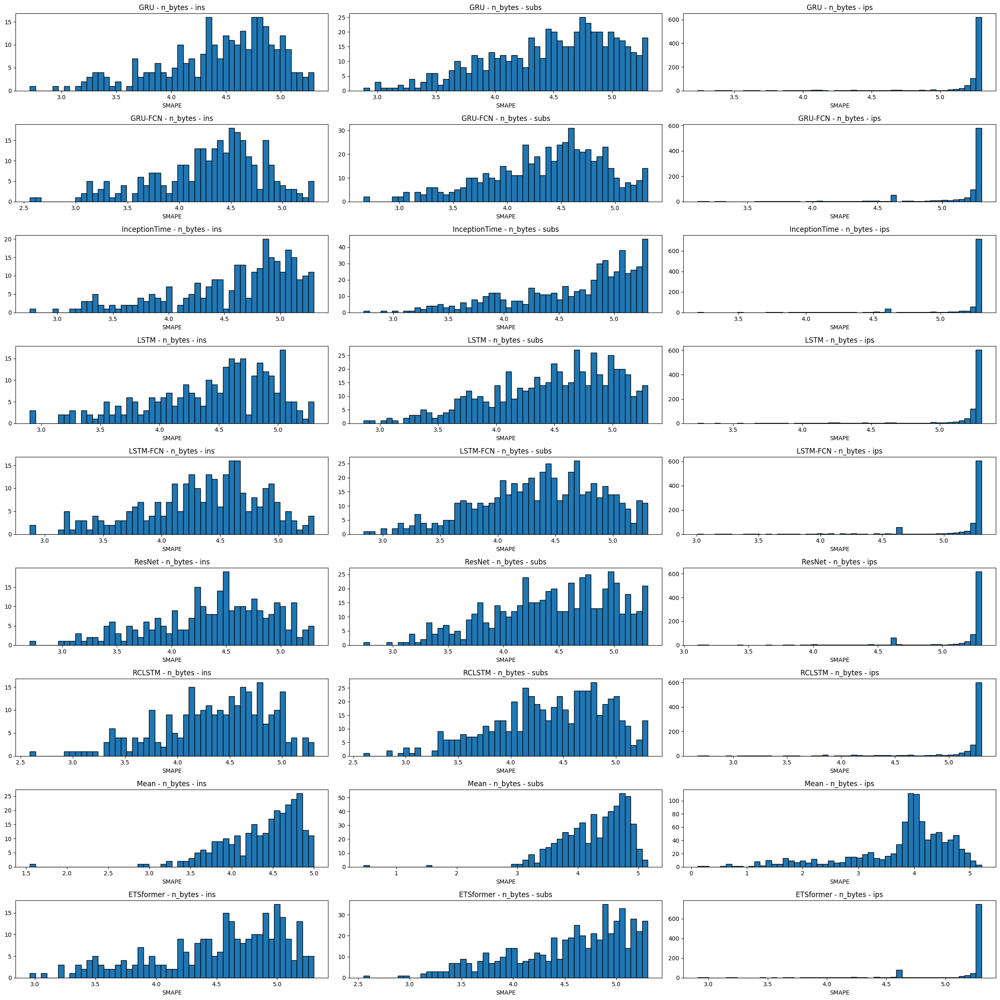

In [14]:
plot_kdes("n_bytes")

### n_flows - The number of flows

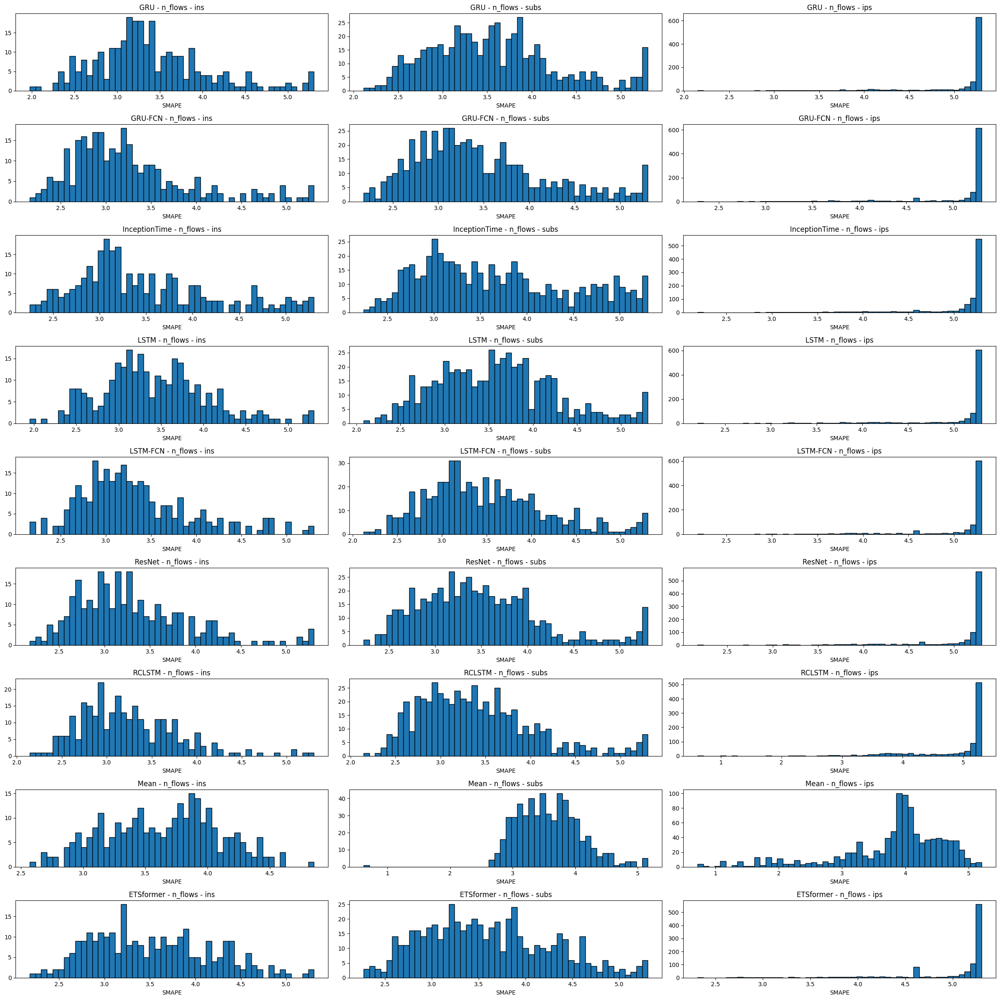

In [15]:
plot_kdes("n_flows")

### n_packets - The number of packets

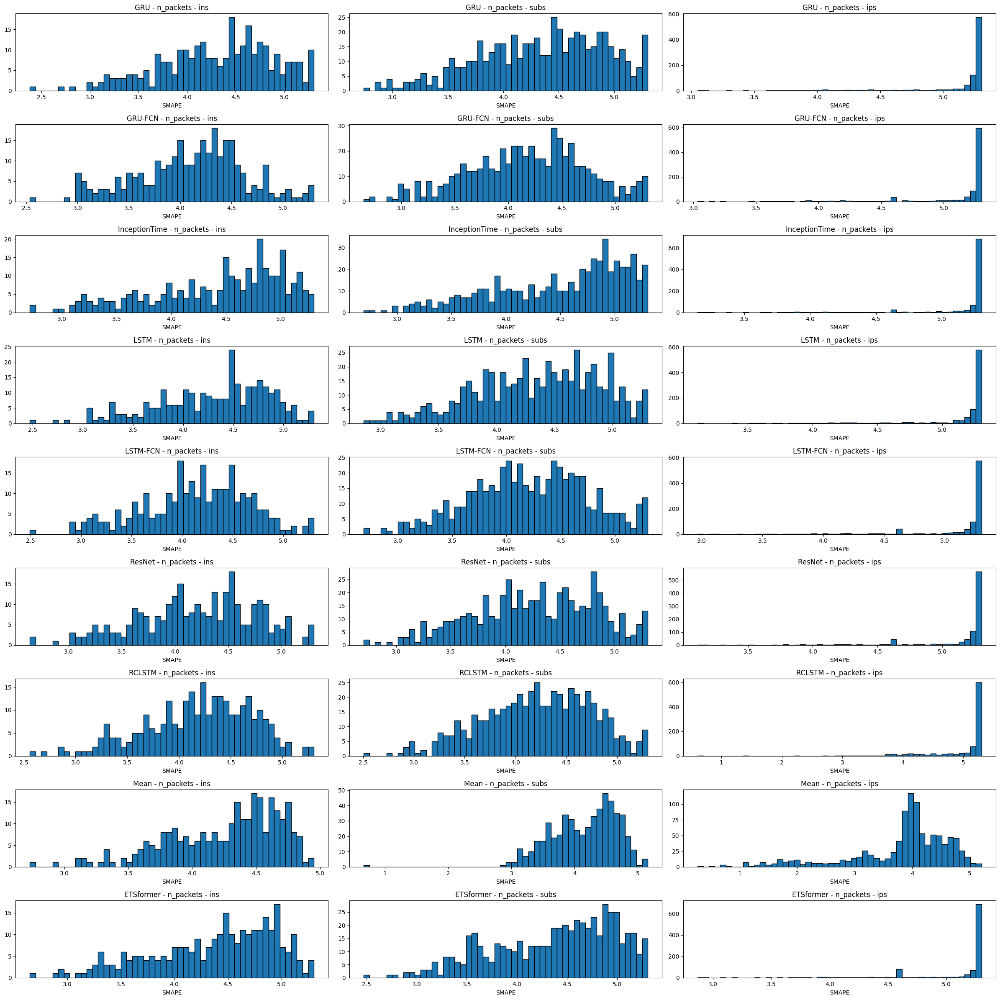

In [16]:
plot_kdes("n_packets")

### tcp_udp_ratio_packets - The TCP/UDP packet ratio

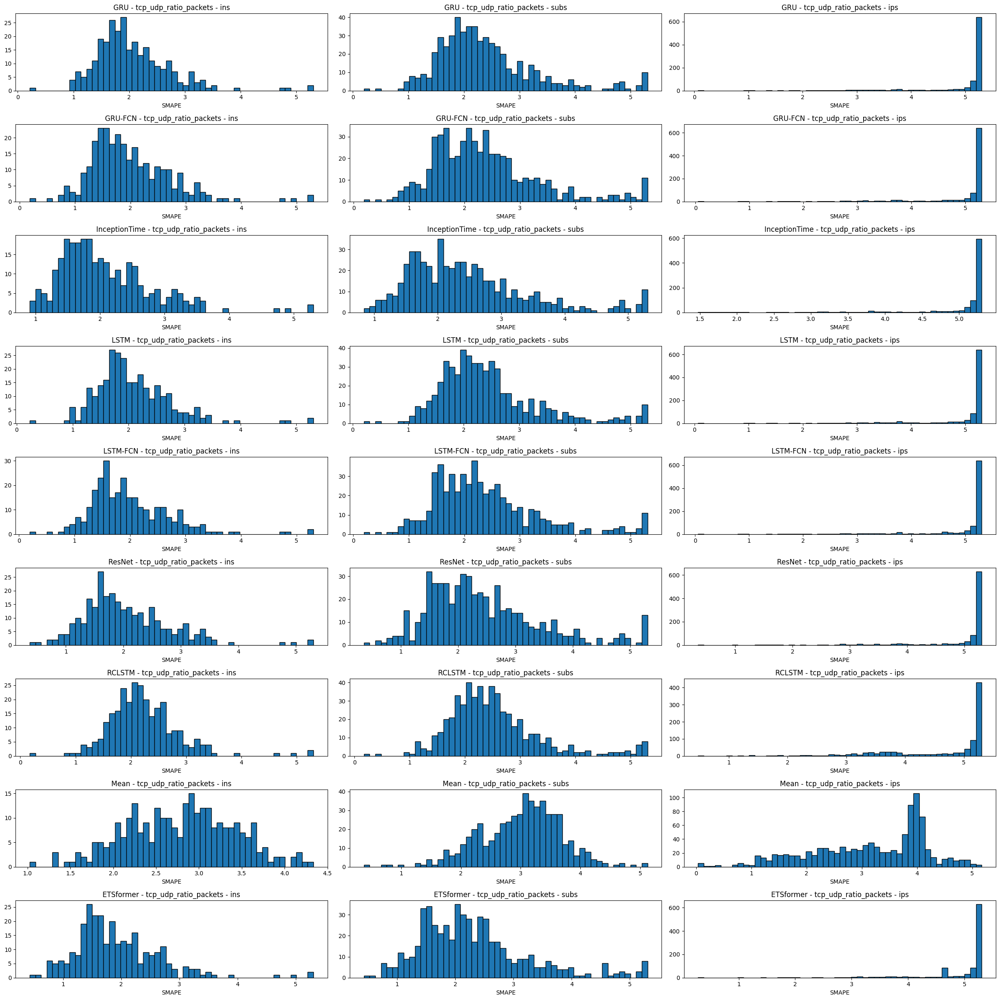

In [17]:
plot_kdes("tcp_udp_ratio_packets")

### tcp_udp_ratio_bytes - The TCP/UDP bytes ratio

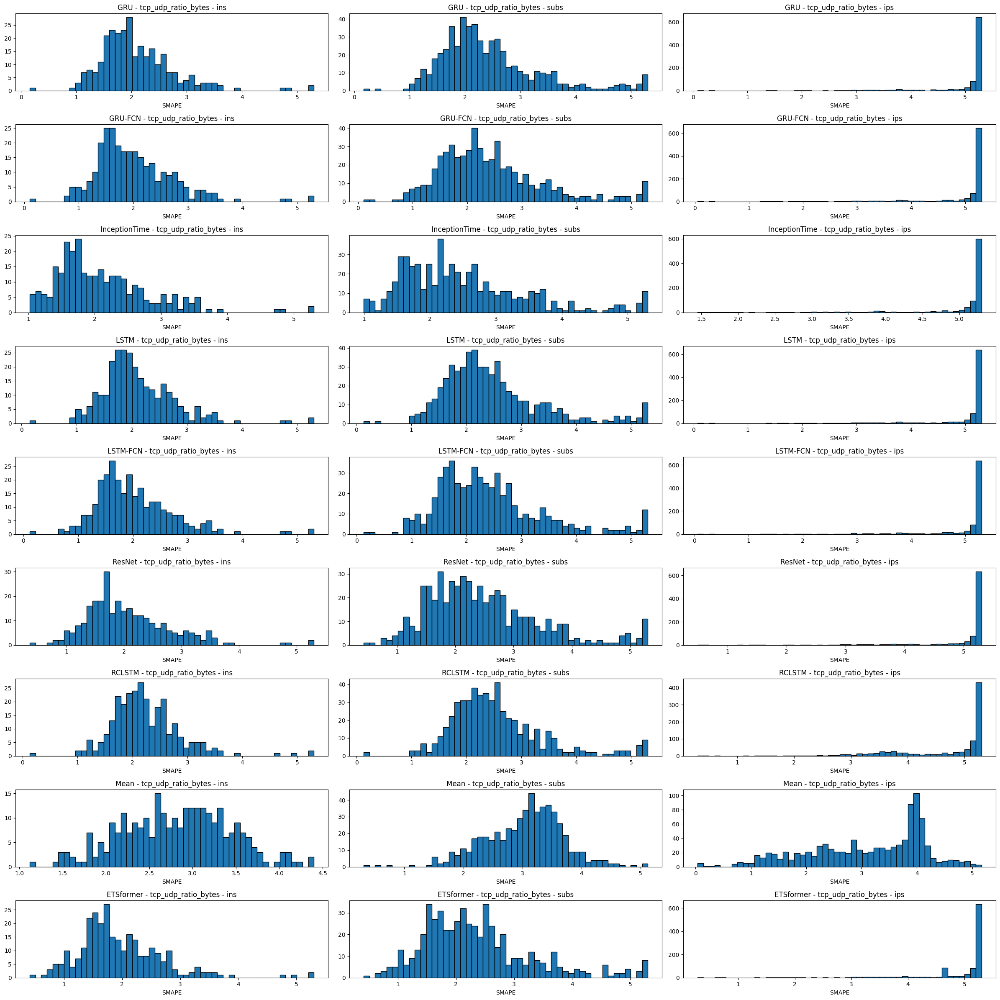

In [18]:
plot_kdes("tcp_udp_ratio_bytes")

### dir_ratio_packets - The directional ratio of packets

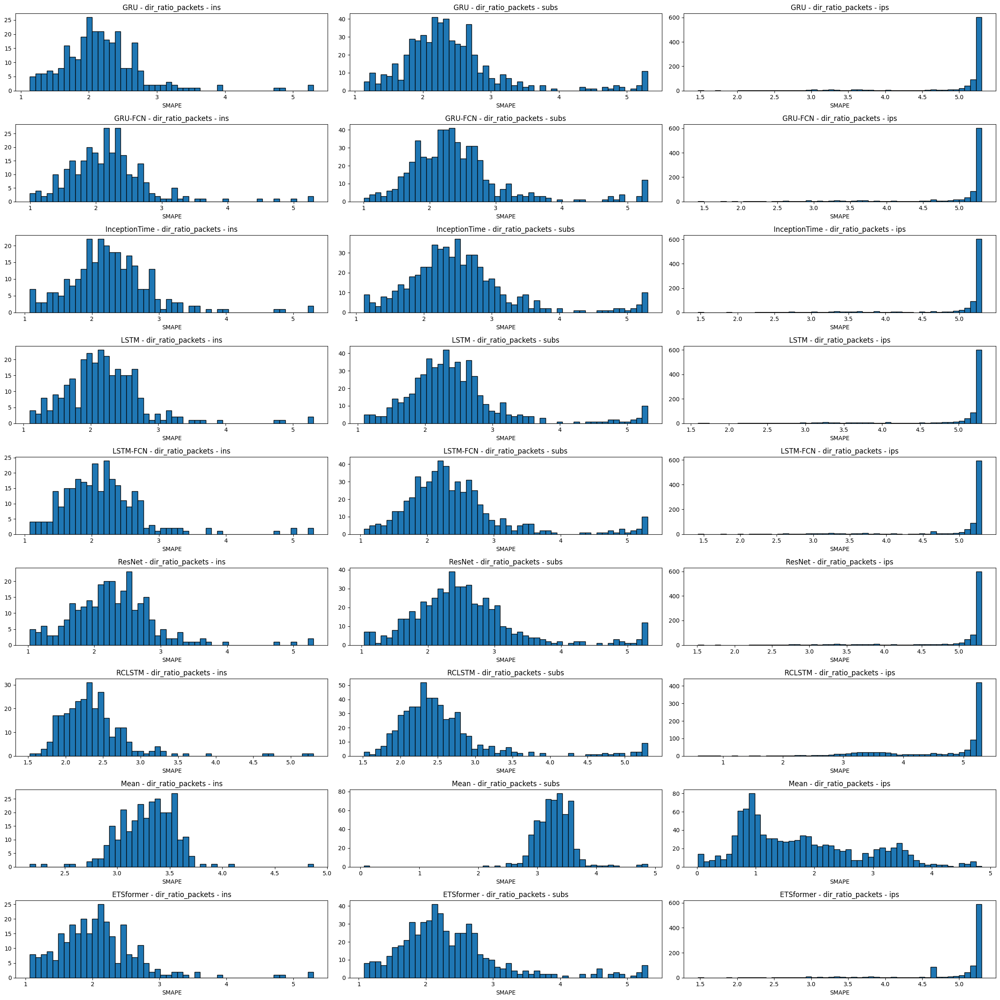

In [19]:
plot_kdes("dir_ratio_packets")

### dir_ratio_bytes - The directional ratio of bytes

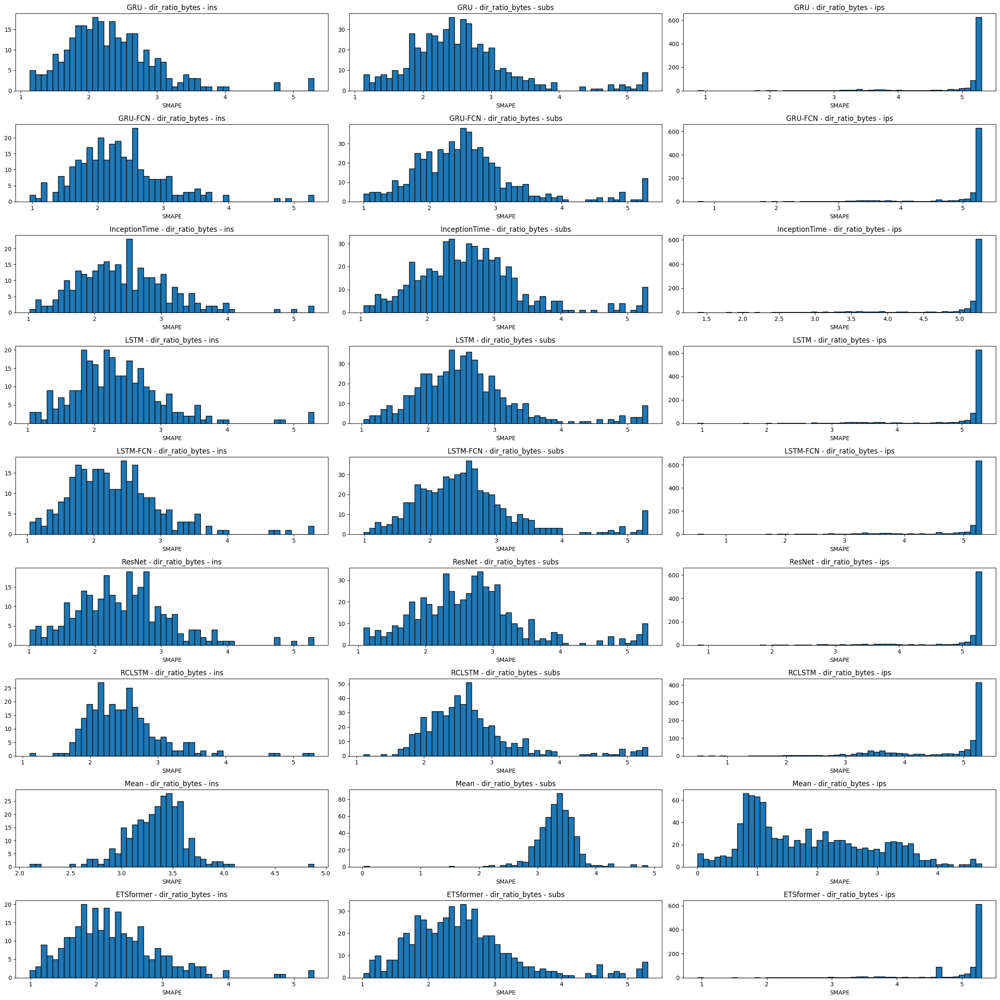

In [20]:
plot_kdes("dir_ratio_bytes")

### avg_ttl - The average TTL

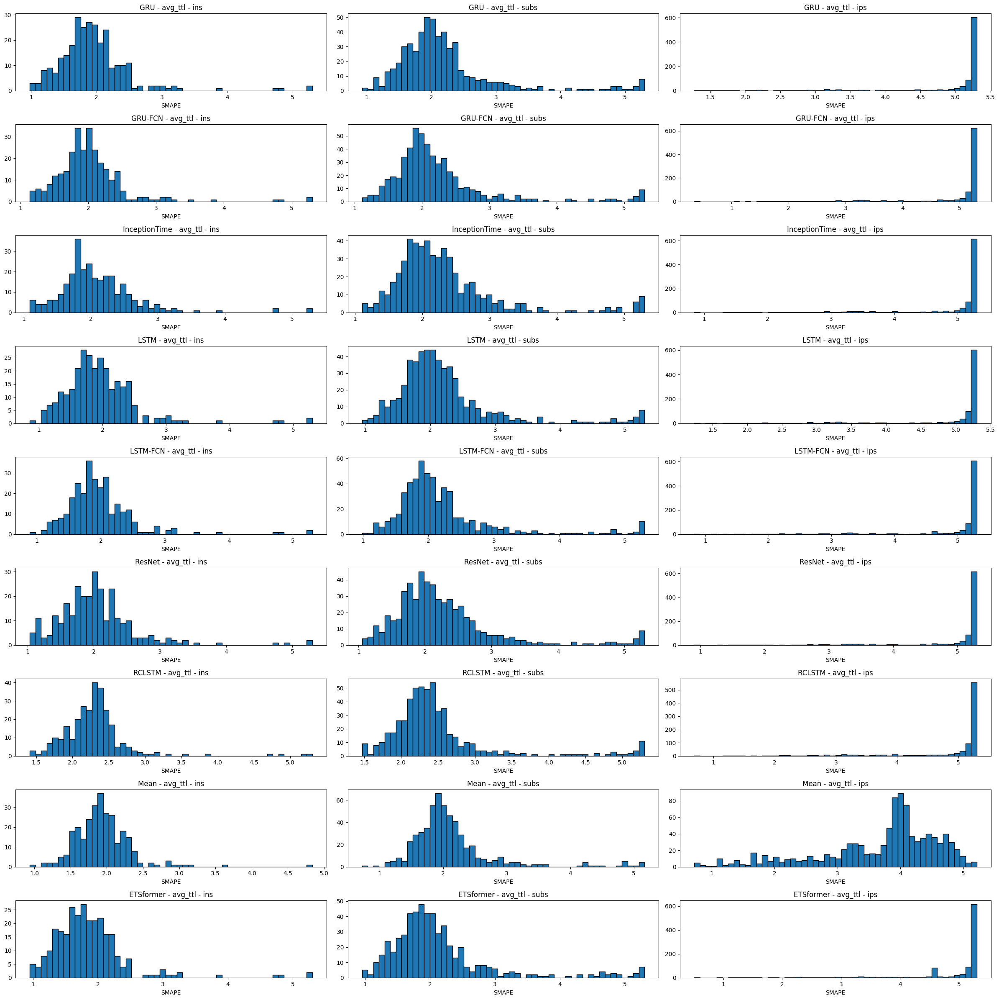

In [21]:
plot_kdes("avg_ttl")

### avg_duration - The average duration

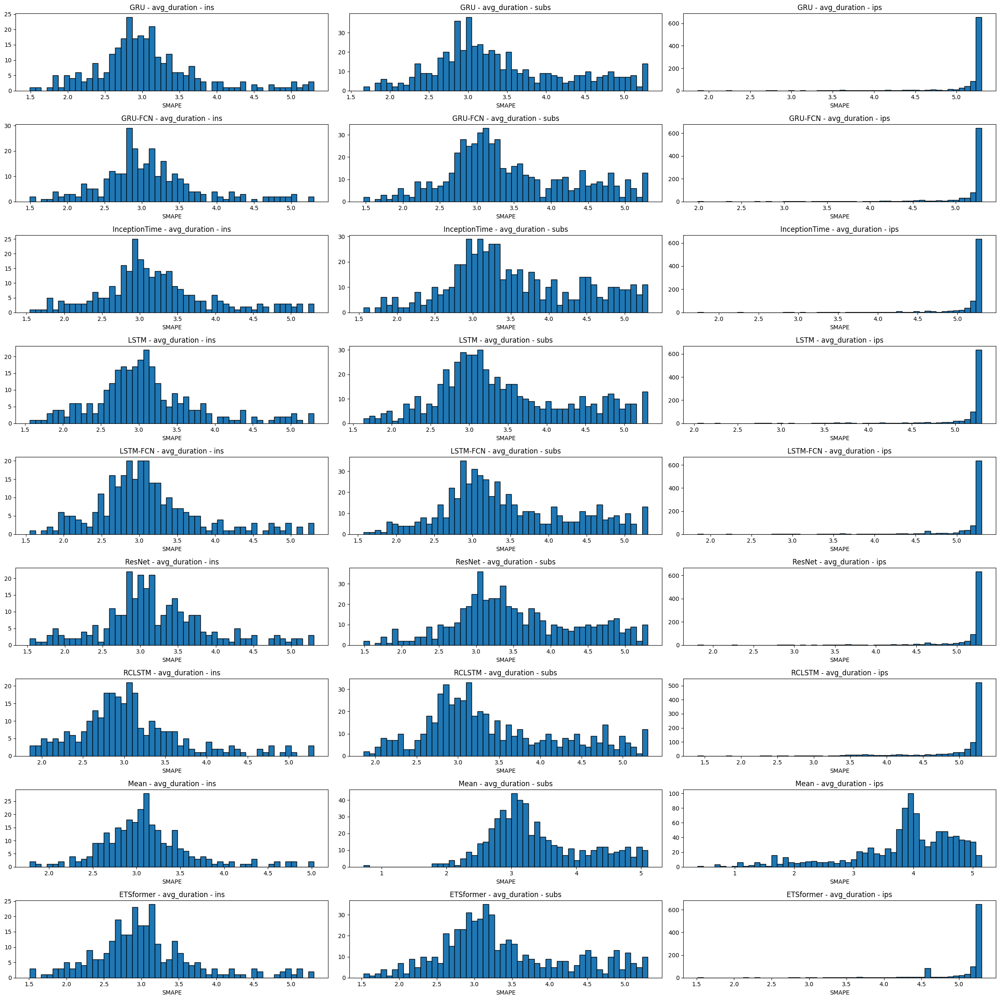

In [22]:
plot_kdes("avg_duration")

### average_n_dest_asn - Average of the number of unique destination ASNs

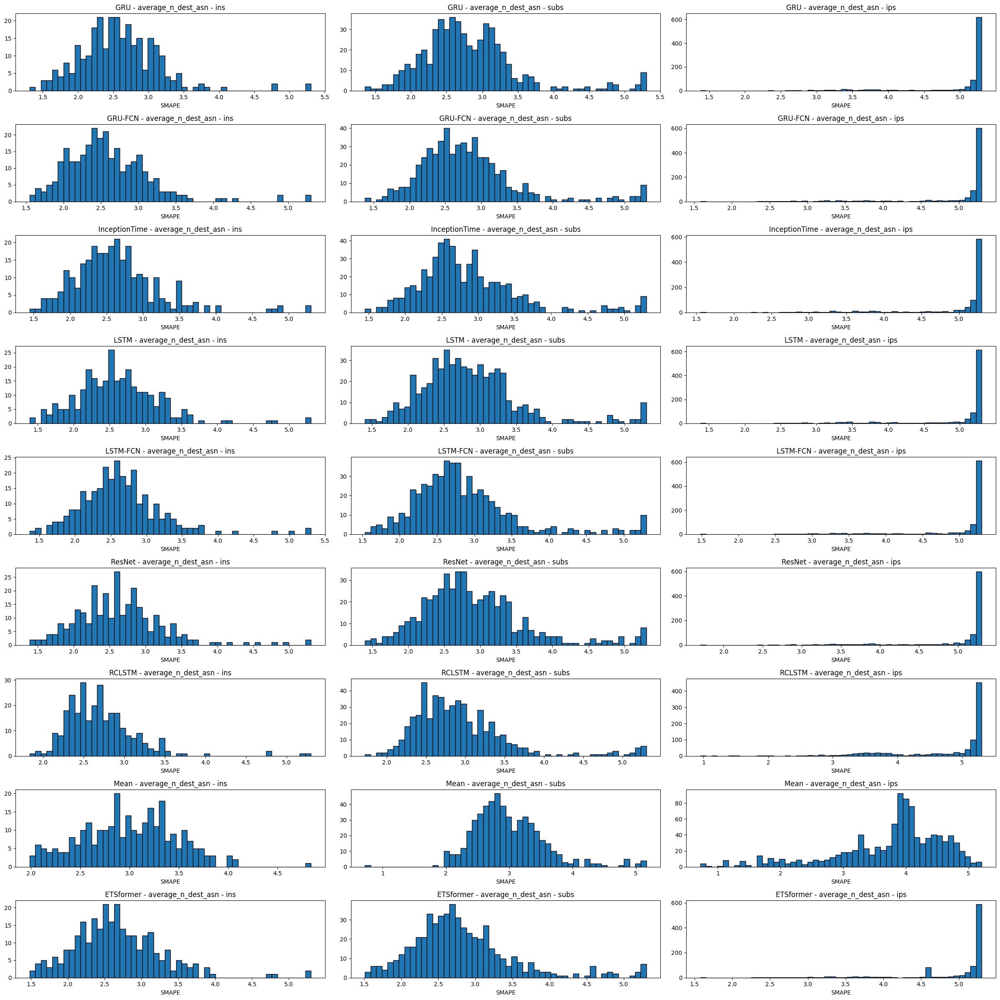

In [23]:
plot_kdes("average_n_dest_asn")

### average_n_dest_ip - Average of the number of unique destination ASNs

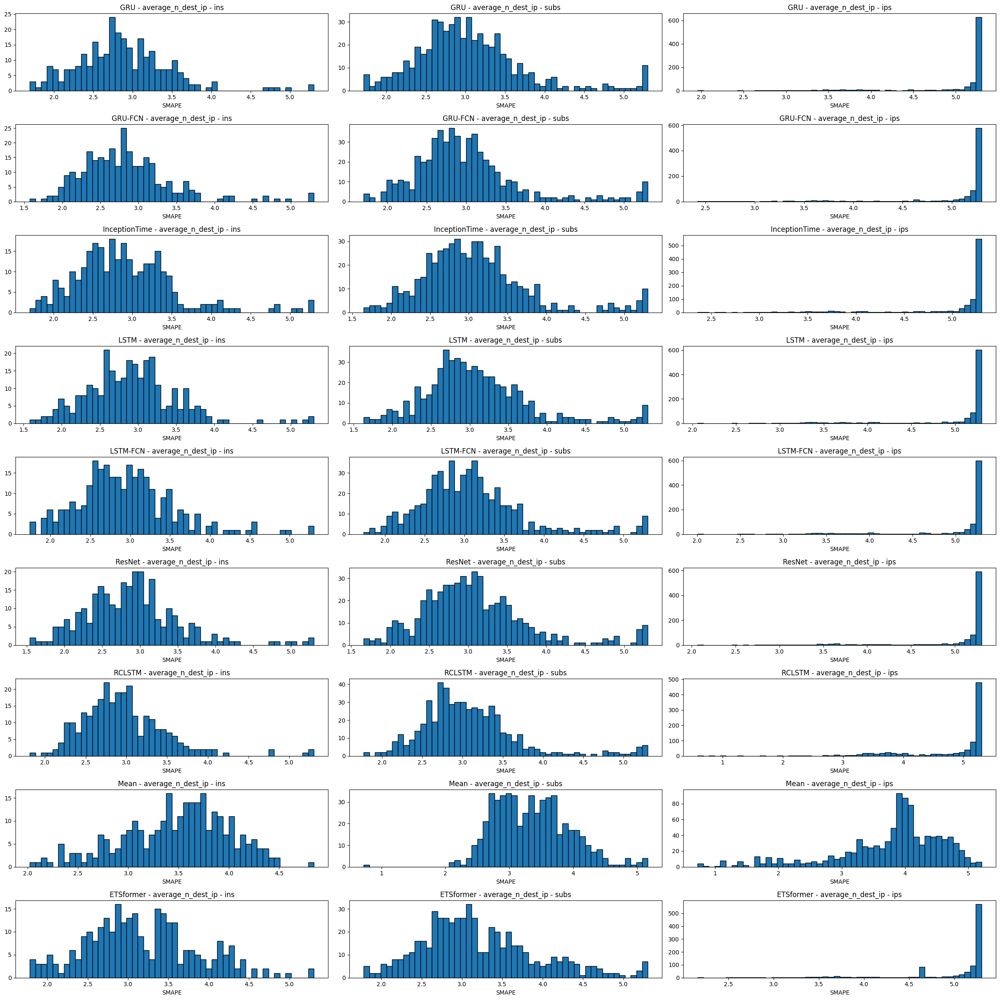

In [24]:
plot_kdes("average_n_dest_ip")

### average_n_dest_ports - Average of the number of unique destination ports

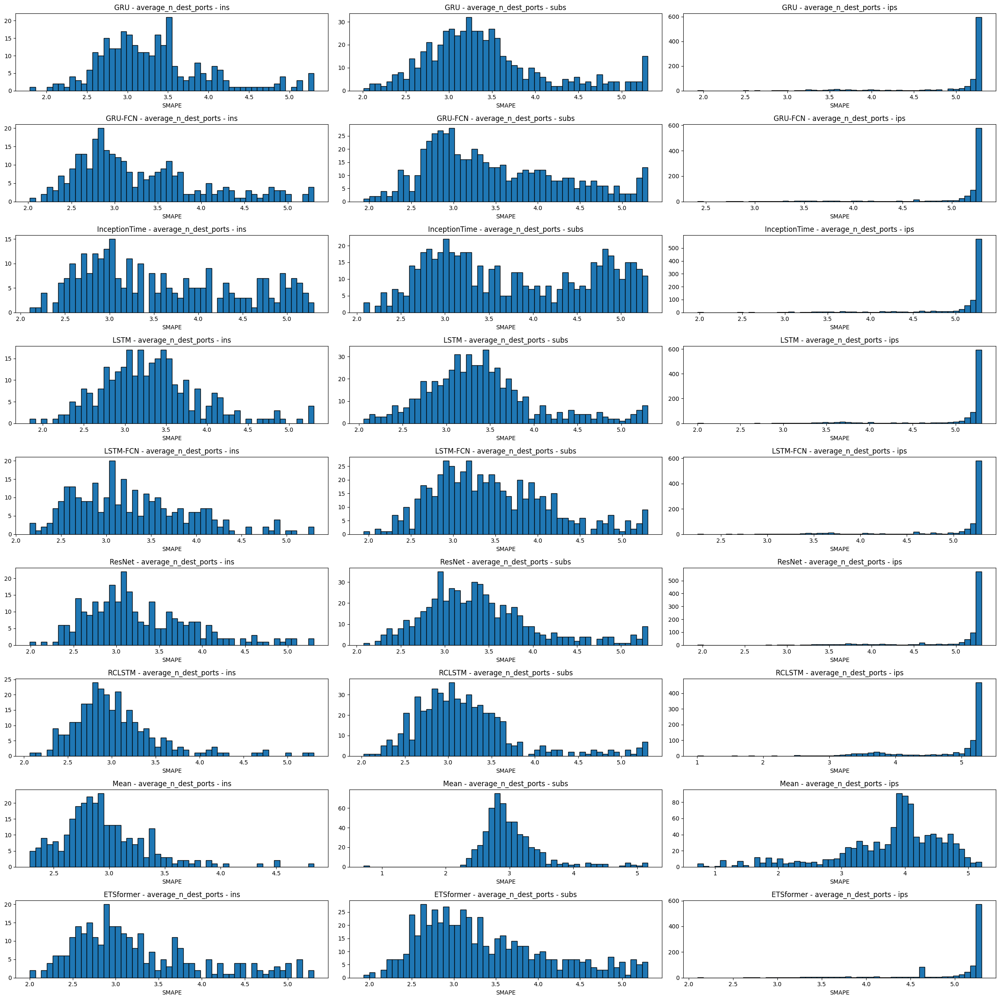

In [25]:
plot_kdes("average_n_dest_ports")

### std_n_dest_asn - Standard deviation of the number of unique destination ASNs

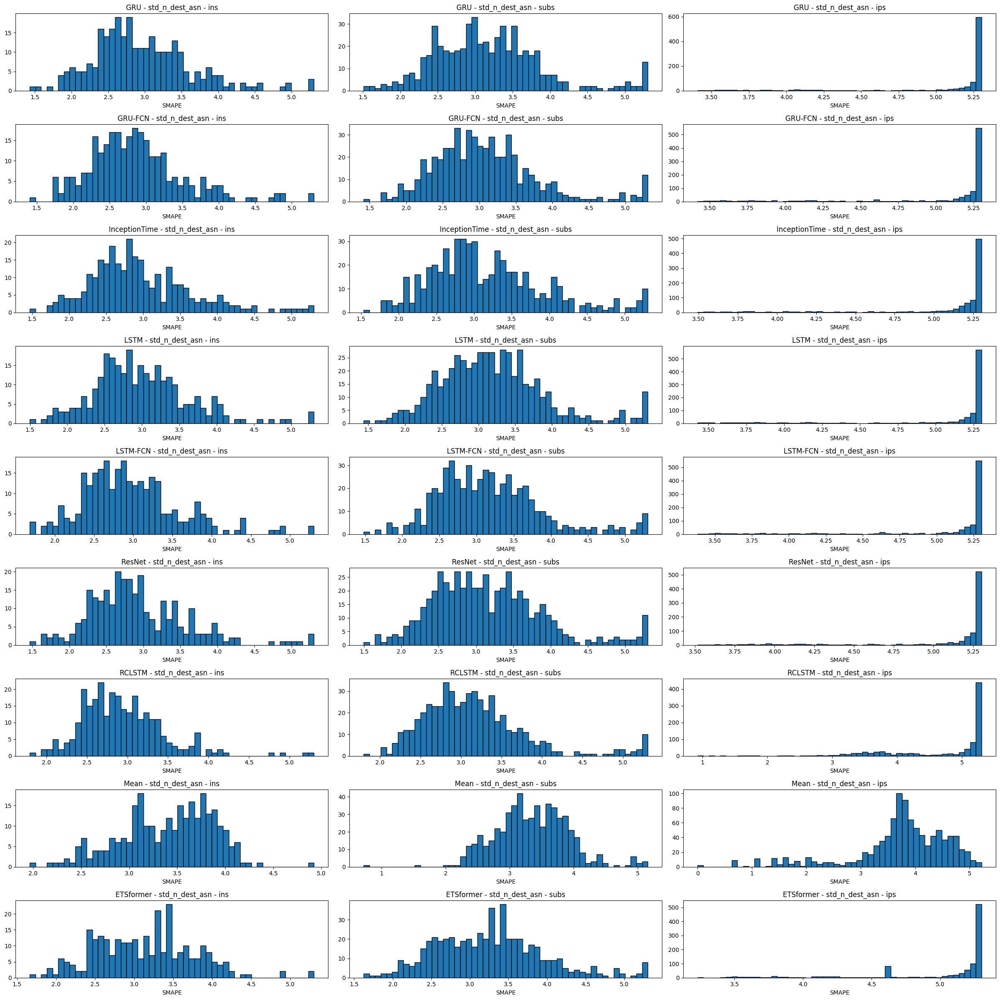

In [26]:
plot_kdes("std_n_dest_asn")

### std_n_dest_ip - Standard deviation of the number of unique destination ASNs

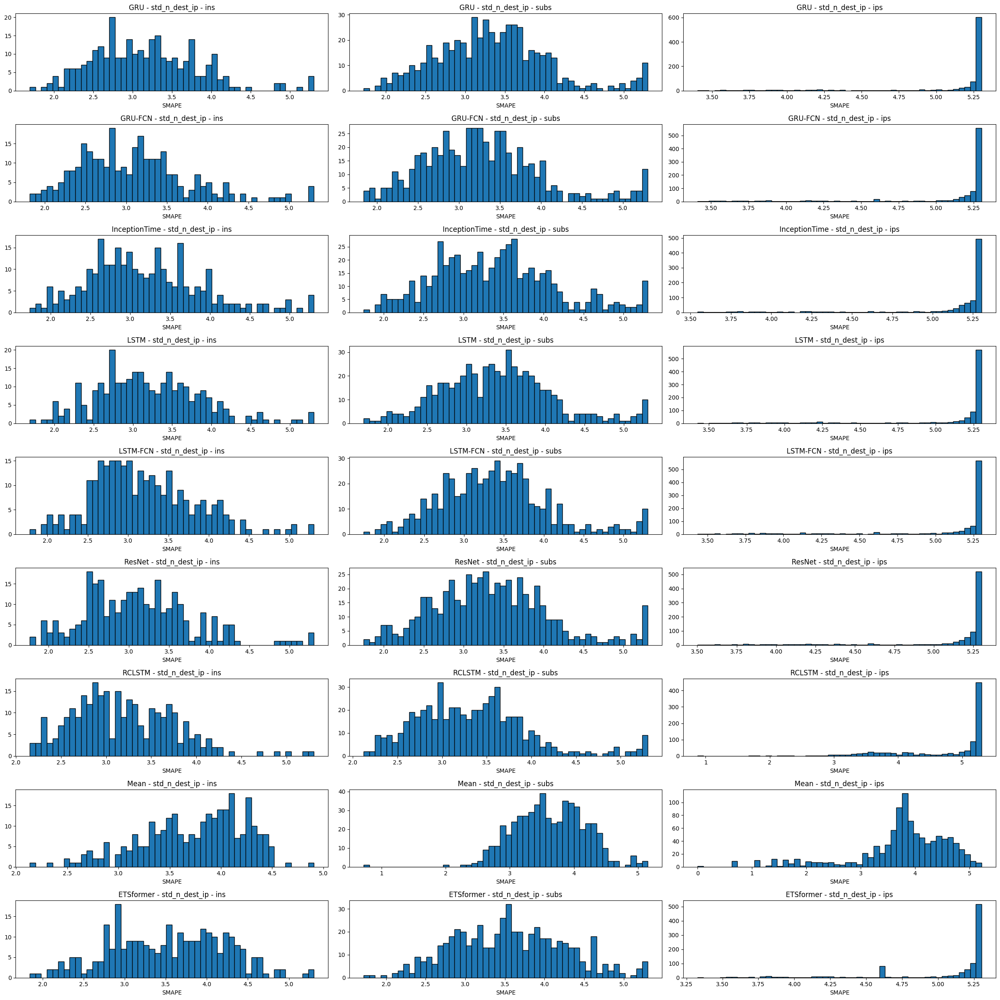

In [27]:
plot_kdes("std_n_dest_ip")

### std_n_dest_ports - Standard deviation of the number of unique destination ports

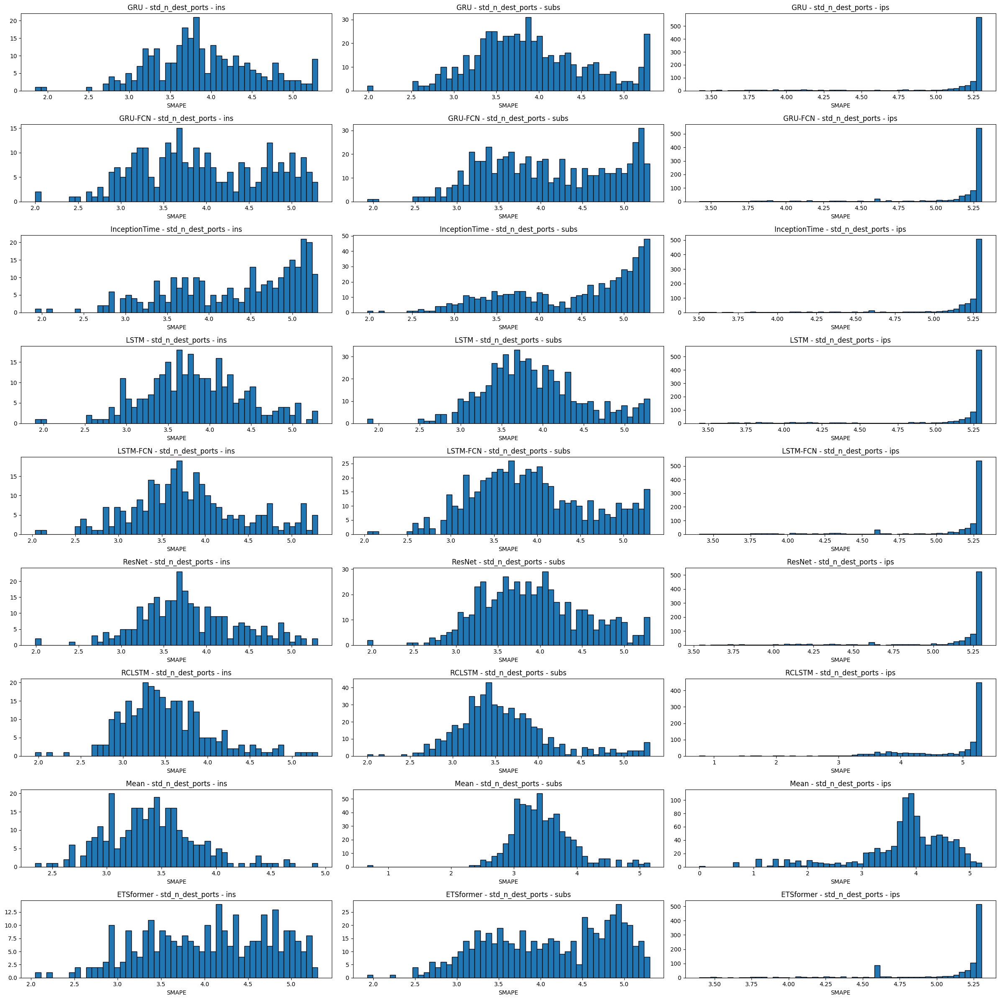

In [28]:
plot_kdes("std_n_dest_ports")

### sum_n_dest_asn - Sum of the number of unique destination ASNs

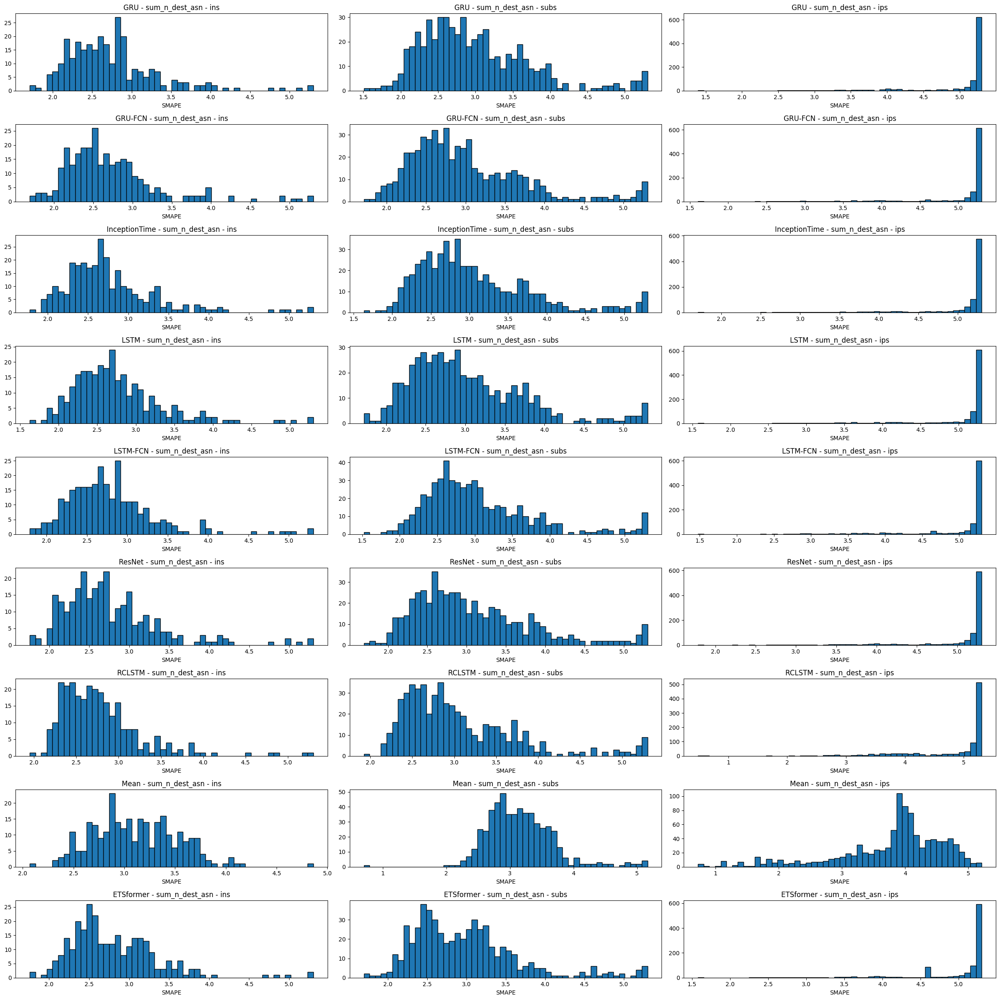

In [29]:
plot_kdes("sum_n_dest_asn")

### sum_n_dest_ip - Sum of the number of unique destination ASNs

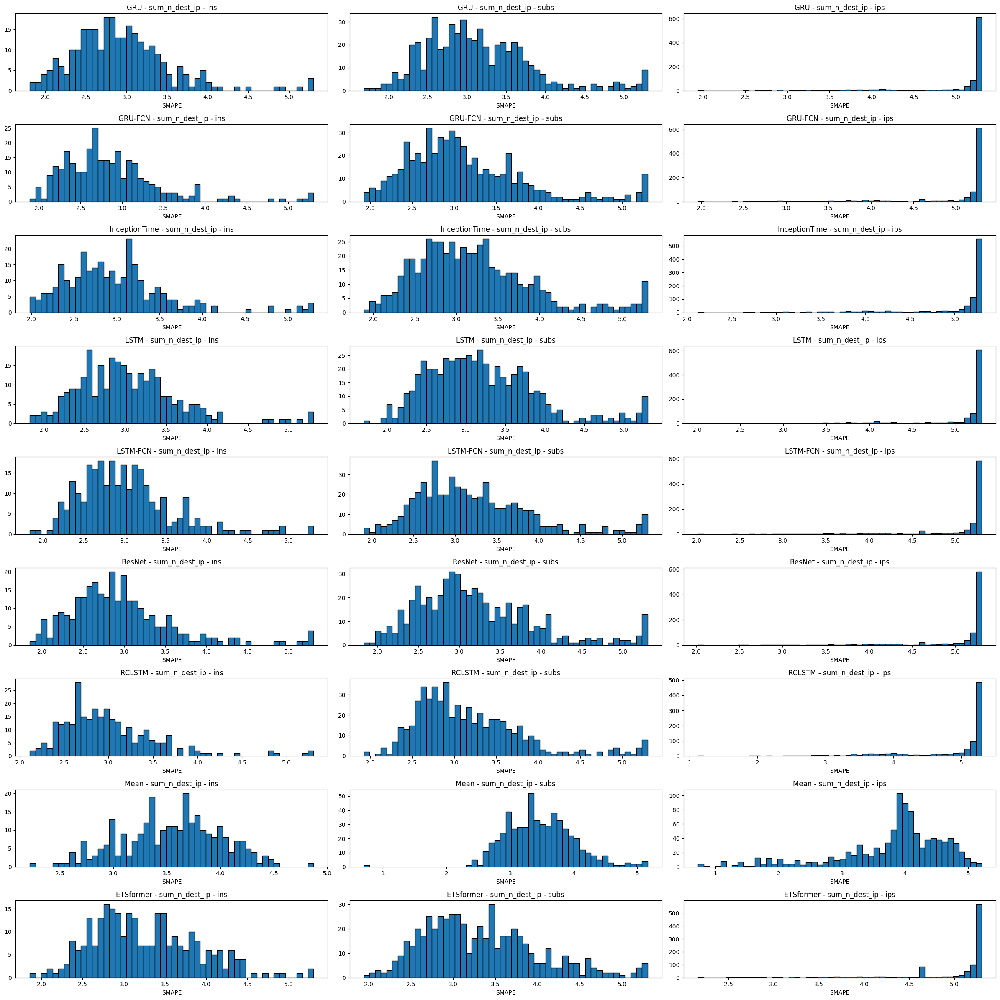

In [30]:
plot_kdes("sum_n_dest_ip")

### sum_n_dest_ports - Sum of the number of unique destination ports

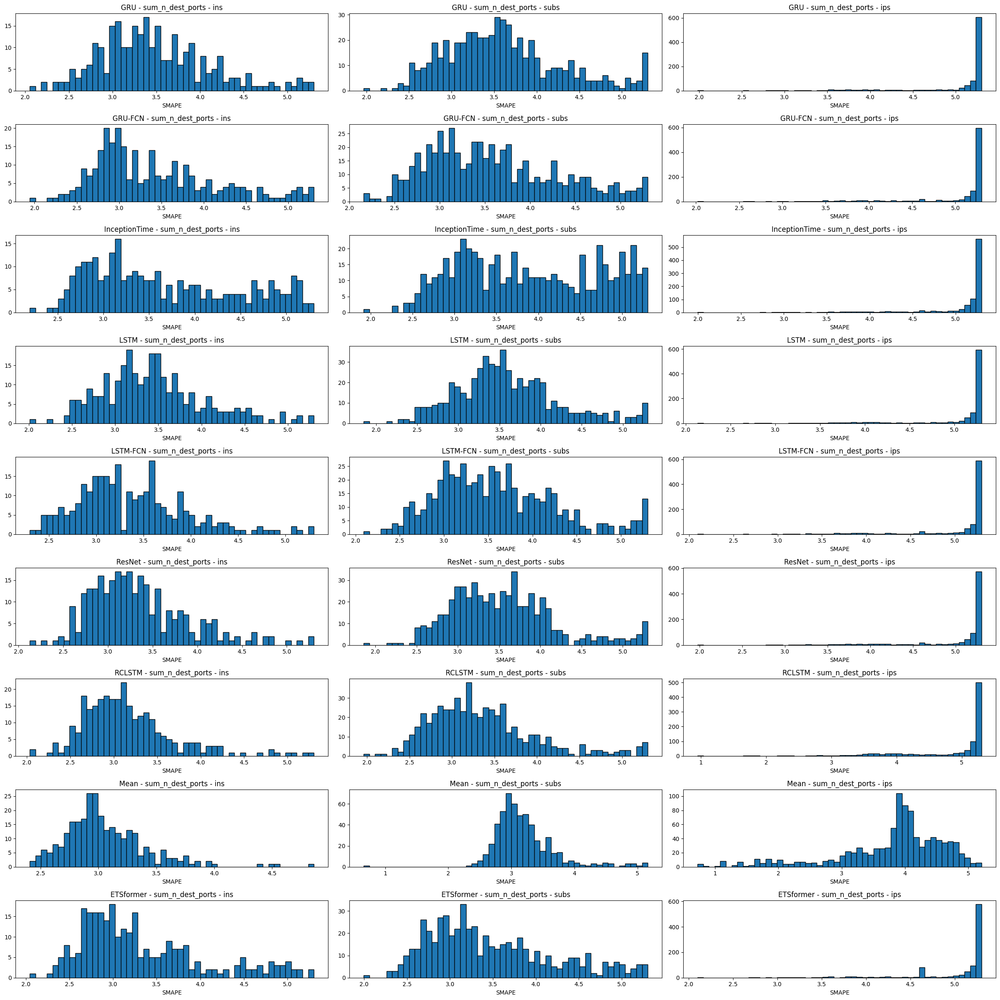

In [31]:
plot_kdes("sum_n_dest_ports")